$$
x^2
$$

In [1]:
import numpy as np
import math as m
import matplotlib.pyplot as plt
import matplotlib.colors as cl
from pylab import *
%load_ext autoreload
%autoreload 2
%matplotlib inline

np.random.seed(100)

#----------------------------------------------------------------------------------------#
# Euler method for solving EDO equations 
def euler_traj(eqs, p, pts=None, vlim=None, nsignal_dict={}, hexagonal=True):
    if pts==None:
        if vlim==None:
            print 'ERROR: Give me a starting point (pts) or the limits for a random start point (vlim)'
            return 0
        pts = {}   
        for j in eqs.keys():
            pts[j] = np.random.uniform(vlim[j][0],vlim[j][1],(p['n'],p['n'])) 

    pts_new = {}
    for t in range(int(p['t']/p['dt'])):
        for key in eqs.keys():
            if key in nsignal_dict.keys(): 
                for k in nsignal_dict[key]:
                    p[k+'n'] = nsignal_sum(p, pts, k, key, hexagonal=hexagonal)
            pts_new[key] = pts[key] + p['dt']*eval(eqs[key], p, pts)
        pts = pts_new
    return pts

#----------------------------------------------------------------------------------------#
# Sum the amount of proteins of the neighboring cells
def nsignal_sum(p, pts, k, key, hexagonal=True):
    n = p['n']
    fng_dic={'D': 'HS(I,I0,pf,ldf)'
            ,'J': 'HS(I,I0,pf,ljf)'
            }
    fng = 1.0
    if k=='N':
        fng = eval(fng_dic[key],p,pts)
    X = periodic_bcondition(pts[k]*fng, n)
    if hexagonal:
        return (1.0/6.0)*( X[0:n,1:(n+1)] + X[1:(n+1),0:n] + X[2:(n+2),1:(n+1)] + X[1:(n+1),2:(n+2)] 
                         + X[0:n,2:(n+2)] + X[2:(n+2),2:(n+2)] )
    return     (1.0/4.0)*( X[0:n,1:(n+1)] + X[1:(n+1),0:n] + X[2:(n+2),1:(n+1)] + X[1:(n+1),2:(n+2)]  )

#----------------------------------------------------------------------------------------#
# Expand the matrix from nxn to (n+2)x(n+2) where the extra rows and columns are chosen by 
# a periodic boundary condition
def periodic_bcondition(f, n):
    out = np.zeros((n+2,n+2))
    out[1:(n+1),1:(n+1)] = f
    out[0      ,1:(n+1)] = out[n      ,1:(n+1)]
    out[n+1    ,1:(n+1)] = out[1      ,1:(n+1)]
    out[1:(n+1),0      ] = out[1:(n+1),n      ]
    out[1:(n+1),n+1    ] = out[1:(n+1),1      ]
    out[0      ,0      ] = out[n      ,n      ]
    out[0      ,n+1    ] = out[n      ,1      ]
    out[n+1    ,n+1    ] = out[1      ,1      ]
    out[n+1    ,0      ] = out[1      ,n      ]
    return out

#----------------------------------------------------------------------------------------#
# Plot a hexagonal lattice from a matrix M
def plot_hex(M, clim=None, cmap=None, clabel=None, fig_name=None, title=None, tr=None, c=None):
    m = copy(M)
    plt.rcParams.update({'font.size': 18}) 
    n = np.shape(m)[0]
    x = np.zeros((n,n))
    y = np.zeros((n,n))
    for i in range(n):
        y[i,:] = np.arange(1,n+1,1)
    for i in range(n):
        if i % 2 != 0:
            x[:,i] = np.arange(1,n+1,1)
        else:
            x[:,i] = np.arange(1,n+1,1) + 0.5

    fig, ax = plt.subplots(figsize=(11.6,10.0))
    if cmap==None:
        cmap = plt.cm.Spectral_r
        
    if tr==None:
        im = ax.scatter(x, y, c=m, s=700000/(n*n), cmap=cmap, linewidths=1, marker=(6, 0, 0))
    else:
        t = {}
        for i in np.arange(0,len(tr),1):
            t[i] = m<tr[i]
        m[m>np.max(tr)] = c[len(tr)]
        for i in np.arange(len(tr),0,-1):
            m[t[i-1]] = c[i-1]
        im = ax.scatter(x, y, c=m, s=700000/(n*n), cmap=cmap,linewidths=1, marker=(6, 0, 0))
        
    plt.xlim([1.0,n])
    plt.ylim([1.0,n])
    if title!=None:
        plt.title(title)  
    if clim!=None:
        im.set_clim(clim)
    cax = fig.add_axes([0.91, 0.2, 0.04, 0.65])
    cbar = fig.colorbar(im, cax, orientation='vertical')
    if clabel!=None:
        cbar.set_label(clabel)
    if fig_name!=None:
        plt.savefig(fig_name, format='pdf', dpi=200)
    plt.show()

#----------------------------------------------------------------------------------------#    
# Auxilary functions
def HS(X,X0,nX,l):
    return l + (1.0-l)/(1.0 + (X/X0)**nX)

def M(X,X0,i,n):
    return ((X/X0)**i)/((1. + (X/X0))**n)

def C(i,n):
    return m.gamma(n+1)/(m.gamma(n-i+1)*m.gamma(i+1))

def Py(X, n, k, u0, gu, gm):
    v1 = 0
    v2 = 0
    for i in range(n):
        v1 += gu[i]*C(i,n)*M(X,u0,i,n)
        v2 += gm[i]*C(i,n)*M(X,u0,i,n)
    return v1/(v2+k)

def Pl(X, n, k, u0, l, gm):
    return Py(X, n, k, u0, l, gm)

In [2]:
def fractionStates(X, tr):
    N = np.float(np.size(X))
    if len(tr)==1:
        return np.sum(X<tr[0])/N, np.sum(X>tr[0])/N 
    elif len(tr)==2:
        return [np.sum(X<tr[0])/N, np.sum((X>tr[0]) & (X<tr[1]))/N, np.sum(X>tr[1])/N]
    
def plot_fractionStates(eqs, p, v, r_v, key, tr, pts_i=None, vlim=None, nsignal_dict=None, l=['M','E/M','E'], 
                        c=['#e8656c','#e4fc36','#00ff9c'], show_snapshot=False, fig_name=None):
    fs = []
    for i in range(len(r_v)):
        if v=='fng':
            p['ldf'] = 1.0 + 4.0*r_v[i]
            p['ljf'] = 1.0 - 0.9*r_v[i]
        elif v=='t':
            if i==0:
                p[v] = r_v[i]
            else:
                p[v] = r_v[i] - r_v[i-1] 
        else:
            p[v] = r_v[i]
        pts = euler_traj(eqs, p, pts=pts_i, vlim=vlim, nsignal_dict=nsignal_dict)
        if v=='t':
            pts_i = pts
        if show_snapshot:
            plot_hex(pts[key], clim=clim, clabel=key)
        fs += [fractionStates(pts[key],tr[key])]
    fs = np.array(fs)
    
    fig = plt.figure(figsize=(9,6))
    colors=['#e8656c','#e4fc36','#00ff9c']
    for i in range(len(tr[key])+1):
        plt.plot(r_v, fs[:,i], ['o-','>-','s-'][i], c=c[i], lw=2, ms=16, label=l[i])
    plt.xlabel(v)
    plt.ylabel('Fraction states')    
    plt.legend()
    if fig_name!=None:
        plt.savefig(fig_name, format='pdf', dpi=200)
    plt.show()

In [3]:
def plot_relativeLevel(eqs, p, v, r_v, key, pts_i=None, vlim=None, nsignal_dict=None, fig_name=None, clim=None,
                      show_snapshot=False, c=['b','r','g','m','k']):
    fs = {}
    for k in key:
        fs[k] = np.zeros(len(r_v))
    for i in range(len(r_v)):
        if v=='fng':
            p['ldf'] = 1.0 + 4.0*r_v[i]
            p['ljf'] = 1.0 - 0.9*r_v[i]
        elif v=='t':
            if i==0:
                p[v] = r_v[i]
            else:
                p[v] = r_v[i] - r_v[i-1] 
        else:
            p[v] = r_v[i]
        pts = euler_traj(eqs, p, pts=pts_i, vlim=vlim, nsignal_dict=nsignal_dict)
        if v=='t':
            pts_i = pts
        if show_snapshot:
            plot_hex(pts[key[0]], clim=clim,clabel=key)
        for k in key:
            fs[k][i] = np.mean(pts[k]) 
    
    plt.figure(figsize=(9,6))
    for k in range(len(key)):
        plt.plot(r_v, np.log2(fs[key[k]]/fs[key[k]][0]), 'go-', lw=2, ms=16, label=key[k], color=c[k])
    plt.xlabel(v)
    plt.ylabel('Relative level of proteins')    
    plt.legend()
    if fig_name!=None:
        plt.savefig(fig_name, format='pdf', dpi=200)
    plt.show()

In [6]:
p  = {'HS' : HS, 'Pl' : Pl, 'Py' : Py
     ,'km' : 5.0e-1
     ,'P0' : 1.0e+2
     # ----------EMT circuit----------
     # ---------see table SI1---------
     ,'l' : [1.0e+0, 6.0e-1, 3.0e-1, 1.0e-1, 5.0e-2, 5.0e-2, 5.0e-2]
     ,'gm': [0.0e+0, 4.0e-2, 2.0e-1, 1.0e+0, 1.0e+0, 1.0e+0, 1.0e+0]
     ,'gu': [0.0e+0, 1*5.0e-3, 2*5.0e-2, 3*5.0e-1, 4*5.0e-1, 5*5.0e-1, 6*5.0e-1]
     # -- see table SI4a (L>Y) -- 
     ,'gu200' : 2.1e+3, 'gmZ': 1.1e+1, 'Z0u200': 2.2e+5, 'Z0mZ': 2.5e+4  
     # -- see table SI4b --
     ,'nZu200': 3.0e+0, 'nZmZ': 2.0e+0, 'nu200' : 6.0e+0, 'nSu200': 2.0e+0, 'nSmZ': 2.0e+0  
     ,'lZu200': 1.0e-1, 'lZmZ': 7.5e+0, 'lSu200': 1.0e-1, 'lSmZ'  : 1.0e+1
     ,'ku200' : 5.0e-2, 'kZ'  : 1.0e-1
     ,'S0u200': 1.8e+5, 'S0mZ': 1.8e+5
     ,'u0200' : 1.0e+4
     # -- see table SI4c --
     ,'nSu34' : 1.0e+0, 'nSmS': 1.0e+0, 'nu34' : 2.0e+0, 'nI'  : 2.0e+0   
     ,'lSu34' : 1.0e-1, 'lSmS': 1.0e-1, 'lZu34': 2.0e-1, 'lImS': 6.5e+0
     ,'ku34'  : 5.0e-2, 'kS'  : 1.25e-1
     ,'gu34'  : 1.35e+3,'gmS' : 9.0e+1
     ,'S0u34' : 3.0e+5, 'S0mS': 2.0e+5
     ,'Z0u34' : 6.0e+5
     ,'u034'  : 1.0e+4
     ,'I0mS'  : 3.0e+2
     # -------------------------------------------
     # ----------Notch Signaling circuit----------
     ,'kP' : 1.0e-1, 'kI' : 5.0e-1                                    
     ,'kc' : 1.0e-4, 'kt' : 1.0e-5                                   
     ,'p'  : 2.0e+0, 'pj' : 2.0e+0, 'pf' : 1.0            
     ,'gmN': 0.8e+1, 'gmD': 2.0e+1, 'gmJ': 7.0e+1     
     ,'I0' : 1.0e+2                                   
     ,'Nt' : 0.0e+0, 'Dt' : 0.0e+3, 'Jt' : 0.0e+3 
     ,'Nn' : 0.0e+0, 'Dn' : 0.0e+3, 'Jn' : 0.0e+3 
     ,'ln' : 7.0e+0, 'ld' : 0.0e+0, 'lj' : 2.0e+0   
     ,'ldf': 3.0,    'ljf': 0.3
     ,'Iext':0.0
     ,'I0Iext': 3.0e+3
     }
eqs= {'W':'gu200*HS(Z,Z0u200,nZu200,lZu200)*HS(S,S0u200,nSu200,lSu200) - gmZ*HS(Z,Z0mZ,nZmZ,lZmZ)*HS(S,S0mZ,nSmZ,lSmZ)*Py(W,6,km,u0200,gu,gm) - gmJ*HS(I,I0,pj,lj)*Py(W,5,km,u0200,gu,gm) - ku200*W'
     ,'Y':'gu34*HS(S,S0u34,nSu34,lSu34)*HS(Z,Z0u34,nu34,lZu34) - gmS*HS(S,S0mS,nSmS,lSmS)*HS(I,I0mS,nI,lImS)*Py(Y,2,km,u034,gu,gm) - gmN*HS(I,I0,p,ln)*Py(Y,2,km,u034,gu,gm) - gmD*HS(I,I0,p,ld)*Py(Y,3,km,u034,gu,gm) - ku34*Y'
     ,'Z':'P0*gmZ*HS(Z,Z0mZ,nZmZ,lZmZ)*HS(S,S0mZ,nSmZ,lSmZ)*Pl(W,6,km,u0200,l,gm) - kZ*Z'
     ,'S':'P0*gmS*HS(S,S0mS,nSmS,lSmS)*HS(I,I0mS,nI  ,lImS)*Pl(Y,2,km,u034,l,gm)*HS(Iext,I0Iext,nI,lImS)  - kS*S'   
     ,'N':'P0*gmN*HS(I,I0,p ,ln)*Pl(Y,2,km,u034, l,gm) - N*( (kc*D + kt*(Dn + Dt))*HS(I,I0,pf,ldf) + (kc*J + kt*(Jn + Jt))*HS(I,I0,pf,ljf) ) - kP*N'
     ,'D':'P0*gmD*HS(I,I0,p ,ld)*Pl(Y,3,km,u034, l,gm) - D*(  kc*N*HS(I,I0,pf,ldf) + kt*(Nn + Nt) ) - kP*D'
     ,'J':'P0*gmJ*HS(I,I0,pj,lj)*Pl(W,5,km,u0200,l,gm) - J*(  kc*N*HS(I,I0,pf,ljf) + kt*(Nn + Nt) ) - kP*J'
     ,'I':'kt*N*( (Dn + Dt)*HS(I,I0,pf,ldf) + (Jn + Jt)*HS(I,I0,pf,ljf) ) - kI*I'
     }
vlim = {'N': [0.0e+4, 3.0e+4], 'D': [0.0e+4, 0.2e+4], 'J': [0.0e+4, 1.0e+4], 'I': [0.0e+4, 0.2e+4]
       ,'W': [0.0e+4, 4.0e+4], 'Z': [0.0e+5, 9.0e+5], 'Y': [0.6e+4, 2.4e+4], 'S': [5.0e+4, 3.0e+5]
       }
vlimE ={'N': [0.0e+4, 3.0e+4], 'D': [0.0e+4, 0.2e+4], 'J': [0.0e+4, 1.0e+4], 'I': [0.0e+4, 0.002e+4]
       ,'W': [1.5e+4, 3.5e+4], 'Z': [0.0e+5, 0.1e+4], 'Y': [1.6e+4, 2.2e+4], 'S': [0.5e+5, 2.0e+5]
       }
vlimEM={'N': [3.0e+4, 4.0e+4], 'D': [0.0e+4, 0.1e+4], 'J': [0.1e+3, 1.0e+3], 'I': [0.5e+3, 1.5e+3]
       ,'W': [0.5e+4, 1.5e+4], 'Z': [1.0e+4, 1.5e+5], 'Y': [1.5e+4, 1.7e+4], 'S': [1.7e+5, 2.1e+5]
       }
vlimM ={'N': [2.0e+4, 3.0e+4], 'D': [0.0e+4, 0.1e+4], 'J': [2.0e+3, 5.0e+3], 'I': [0.4e+3, 1.6e+3]
       ,'W': [0.0e+4, 0.5e+4], 'Z': [4.0e+5, 8.5e+5], 'Y': [0.6e+4, 1.5e+4], 'S': [2.0e+5, 3.0e+5]
       }
nsignal_dict={'N': ['D', 'J'], 'I': ['D', 'J'], 'D': ['N'], 'J': ['N']
             }

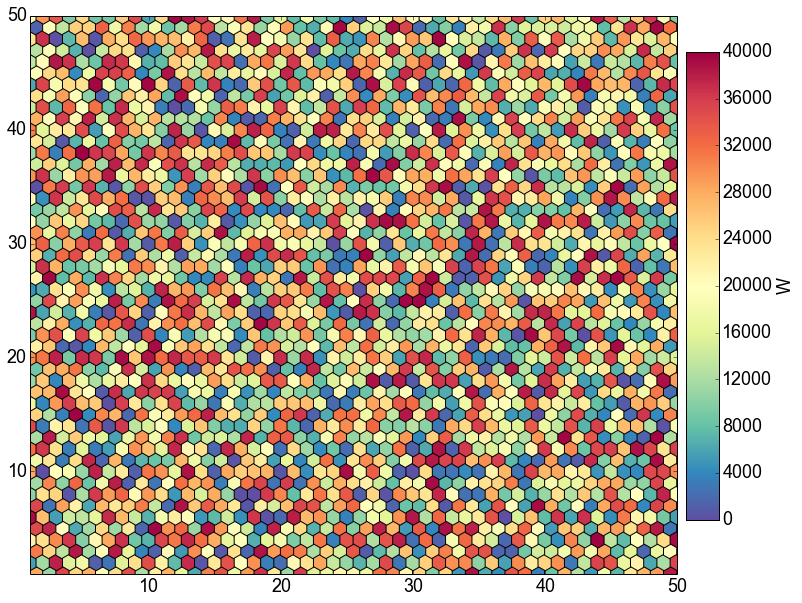

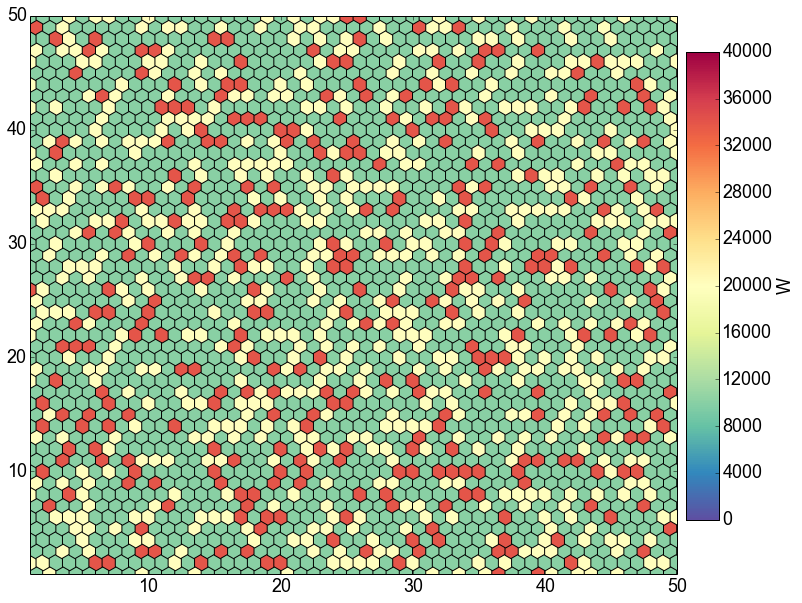

In [7]:
# initial condiction Figure S4
p['n']  = 50     # number of cells = n x n
p['dt'] = 0.1    # time step of the Euler method

key = 'W'          # key parameter for hexagonal snapshot plot
tr  = {'W': [5000, 15000]}
clim = [0,40000] # Color range for the plot

p['t']  = p['dt']
pts_i = euler_traj(eqs, p, pts=None, vlim=vlim, nsignal_dict=nsignal_dict)
plot_hex(pts_i[key], clim=clim, clabel=key)#, fig_name='./figures/IC.pdf')
plot_hex(pts_i[key], clim=clim, clabel=key, tr=[5000,15000], c=[34000, 20000, 10000])#, fig_name='./figures/IC_tr.pdf')

p['t']  = 120    # total time in hours

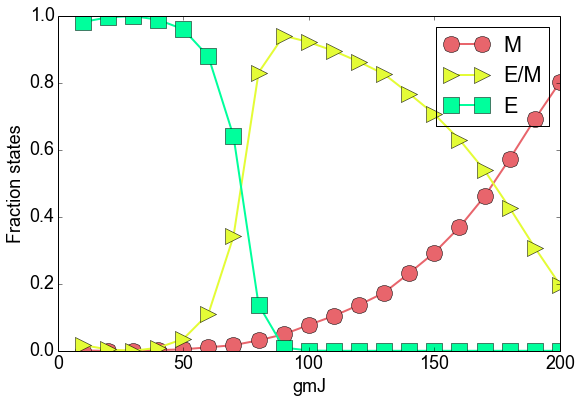

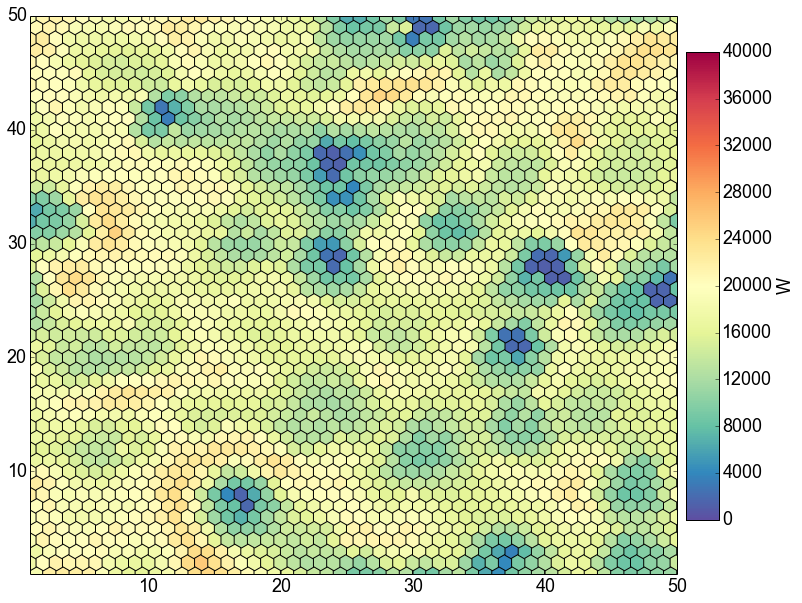

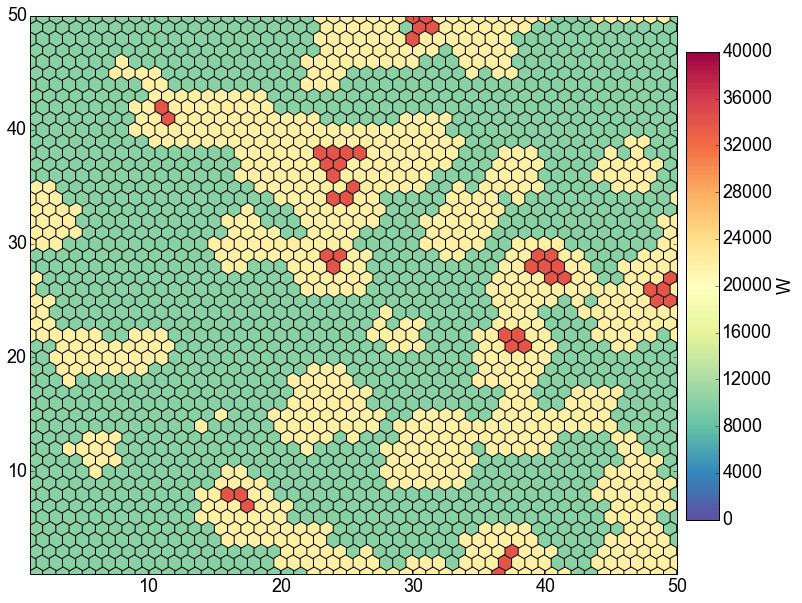

In [8]:
# Figures 4B and 4D
v = 'gmJ'
r_v = np.arange(10, 201, 10)
plot_fractionStates(eqs, p, v, r_v, key, tr, pts_i=pts_i, vlim=vlim, nsignal_dict=nsignal_dict, 
                    show_snapshot=False)#, fig_name='./figures/FrStates_J0.pdf')

p['gmJ'] = 70    # production of Jagged
pts_J070 = euler_traj(eqs, p, pts=pts_i, vlim=vlim, nsignal_dict=nsignal_dict)
plot_hex(pts_J070[key], clim=clim, clabel=key)#, fig_name='./figures/Snapshot_J0high.pdf')
plot_hex(pts_J070[key], clim=clim, clabel=key, tr=[5000,15000], c=[34000, 22000, 10000], 
         )#fig_name='./figures/Snapshot_J0high_tr.pdf')

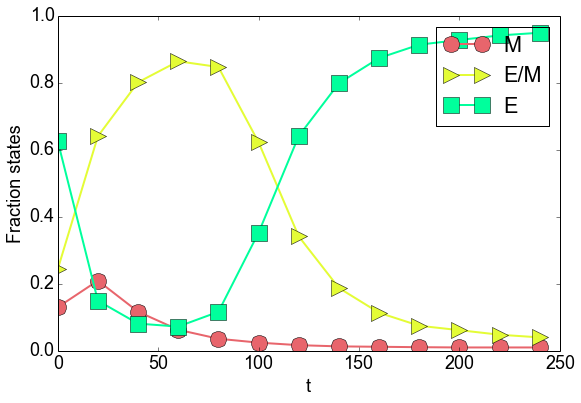

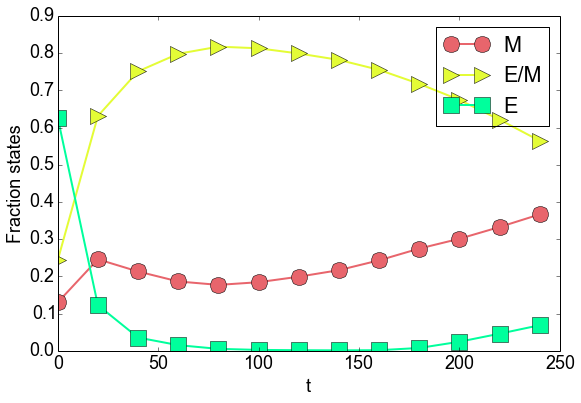

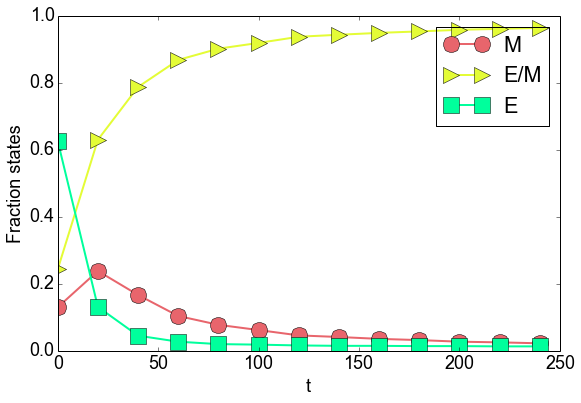

In [9]:
# Figures S5 A, C, E
v = 't'
r_v = np.arange(0,241,20)
plot_fractionStates(eqs, p, v, r_v, key, tr, pts_i=pts_i, vlim=vlim, nsignal_dict=nsignal_dict, 
                    show_snapshot=False)#, fig_name='./figures/FrStates_J0high_tr_t.pdf')

p['Iext'] = 400
plot_fractionStates(eqs, p, v, r_v, key, tr, pts_i=pts_i, vlim=vlim, nsignal_dict=nsignal_dict, 
                    show_snapshot=False)#, fig_name='./figures/FrStates_J0high_tr_Iext400_t.pdf')

p['Iext'] = 0
p['Jt']   = 2000
plot_fractionStates(eqs, p, v, r_v, key, tr, pts_i=pts_i, vlim=vlim, nsignal_dict=nsignal_dict, 
                    show_snapshot=False)#, fig_name='./figures/FrStates_J0high_tr_Jt2_t.pdf')
p['Jt']   = 0

p['t']  = 120   

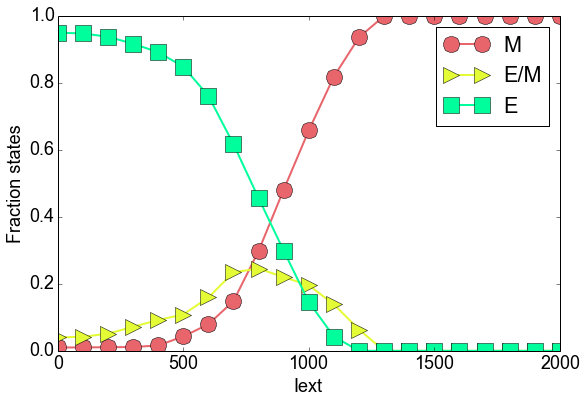

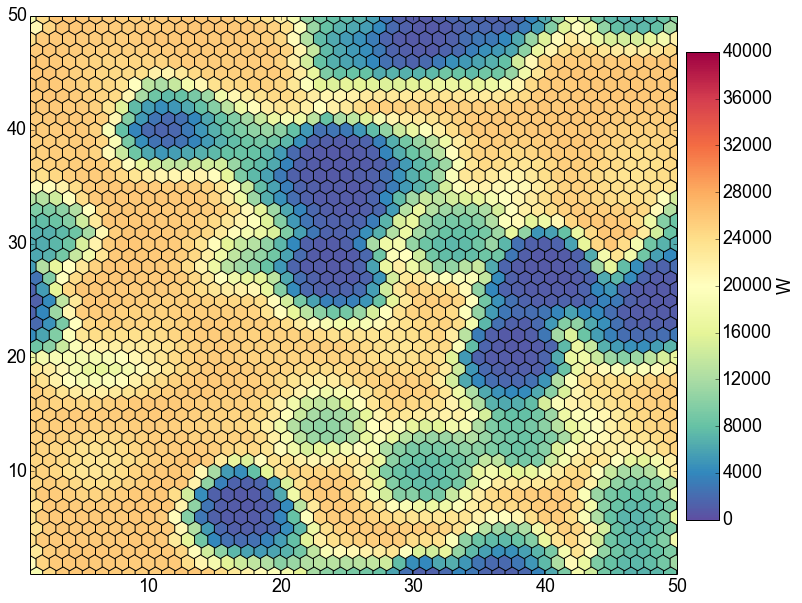

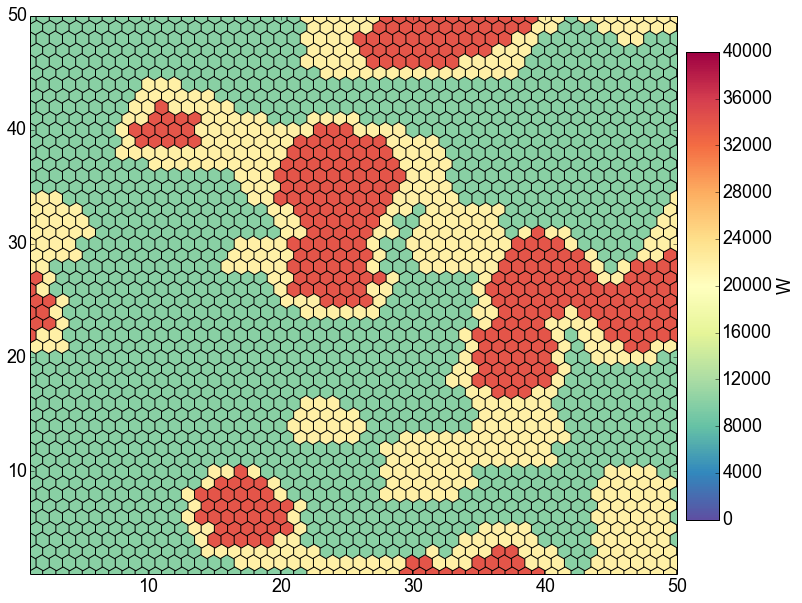

In [10]:
# Figure 5A-B
v = 'Iext'
r_v = np.arange(0.0, 2000.1, 100.0)
plot_fractionStates(eqs, p, v, r_v, key, tr, pts_i=pts_J070, vlim=vlim, nsignal_dict=nsignal_dict, 
                    show_snapshot=False)#, fig_name='./figures/FrStates_J0high_Iext.pdf')

p['Iext'] = 700
pts_J070_I700 = euler_traj(eqs, p, pts=pts_J070, vlim=vlim, nsignal_dict=nsignal_dict)
plot_hex(pts_J070_I700[key], clim=clim, clabel=key)#, fig_name='./figures/Snapshot_J0high_Iext700.pdf')
plot_hex(pts_J070_I700[key], clim=clim, clabel=key, tr=[5000,15000], c=[34000, 22000, 10000], 
         )#fig_name='./figures/Snapshot_J0high_tr_Iext700.pdf')

p['Iext'] = 0

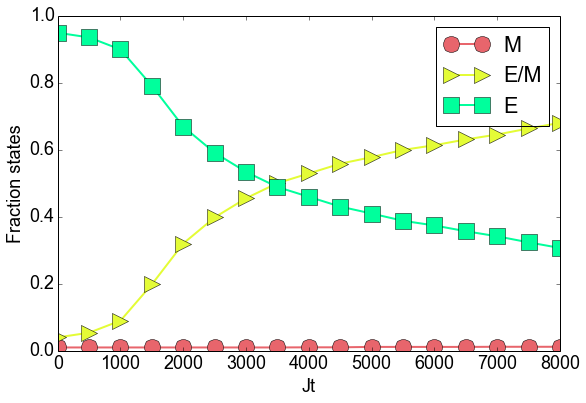

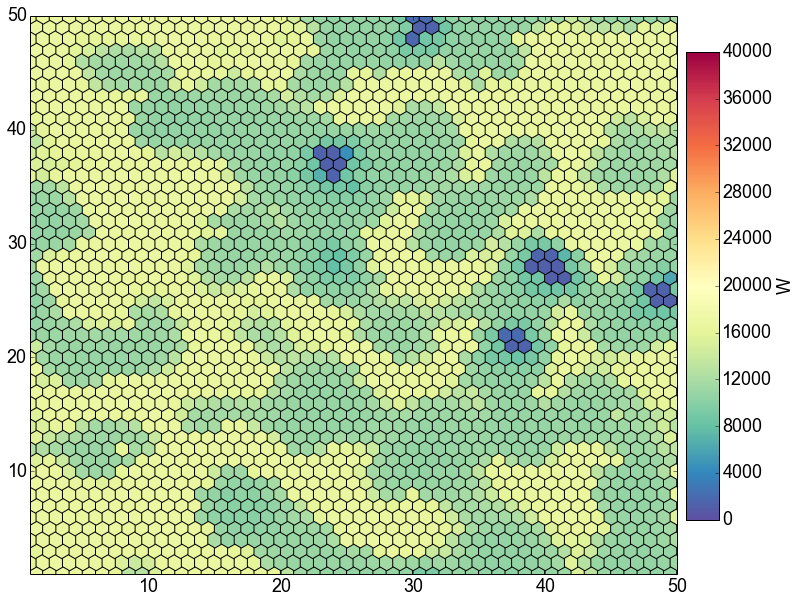

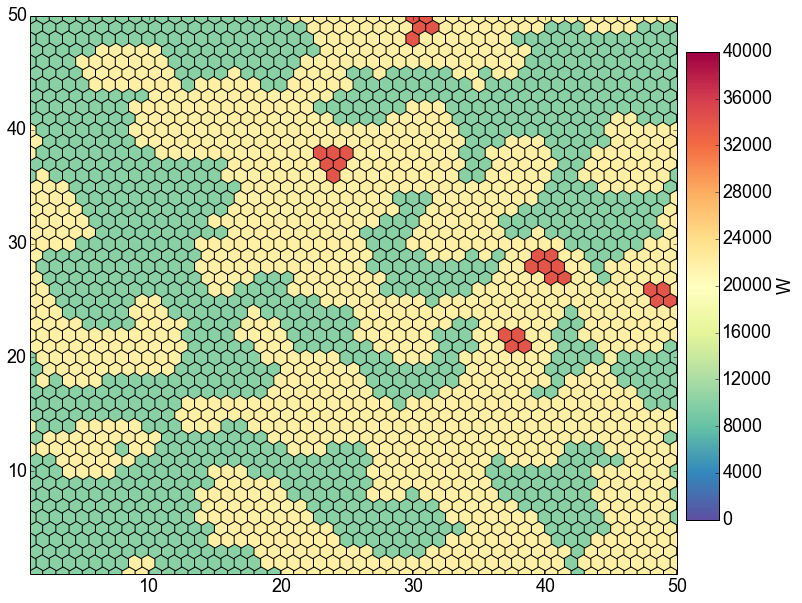

In [11]:
# Figure 5C-D
v = 'Jt'
r_v = np.arange(0.0, 8000.1, 500.0)
plot_fractionStates(eqs, p, v, r_v, key, tr, pts_i=pts_J070, vlim=vlim, nsignal_dict=nsignal_dict, 
                    show_snapshot=False)#, fig_name='./figures/FrStates_J0high_Jt.pdf')

p['Jt'] = 4000
pts_J070_Jt4 = euler_traj(eqs, p, pts=pts_J070, vlim=vlim, nsignal_dict=nsignal_dict)
plot_hex(pts_J070_Jt4[key], clim=clim, clabel=key)#, fig_name='./figures/Snapshot_J0high_Jt4.pdf')
plot_hex(pts_J070_Jt4[key], clim=clim, clabel=key, tr=[5000,15000], c=[34000, 22000, 10000], 
         )#fig_name='./figures/Snapshot_J0high_tr_Jt4.pdf')

p['Jt'] = 0

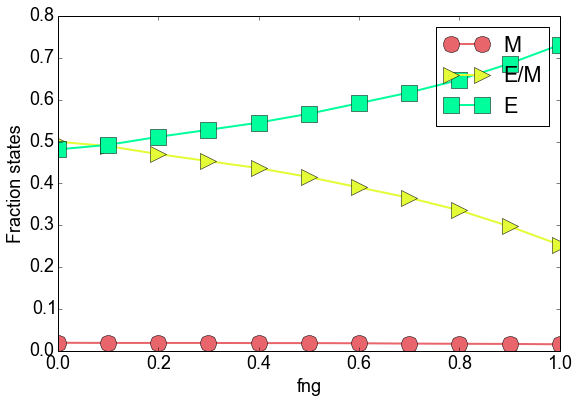

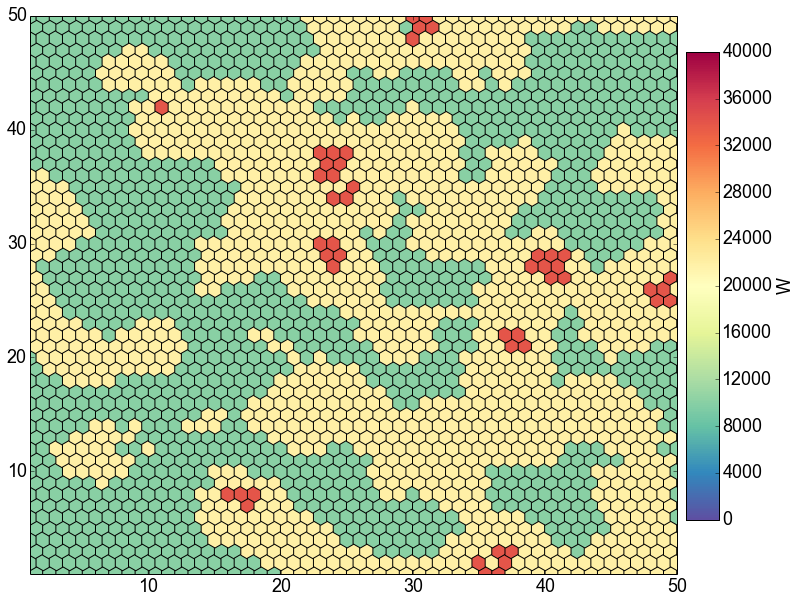

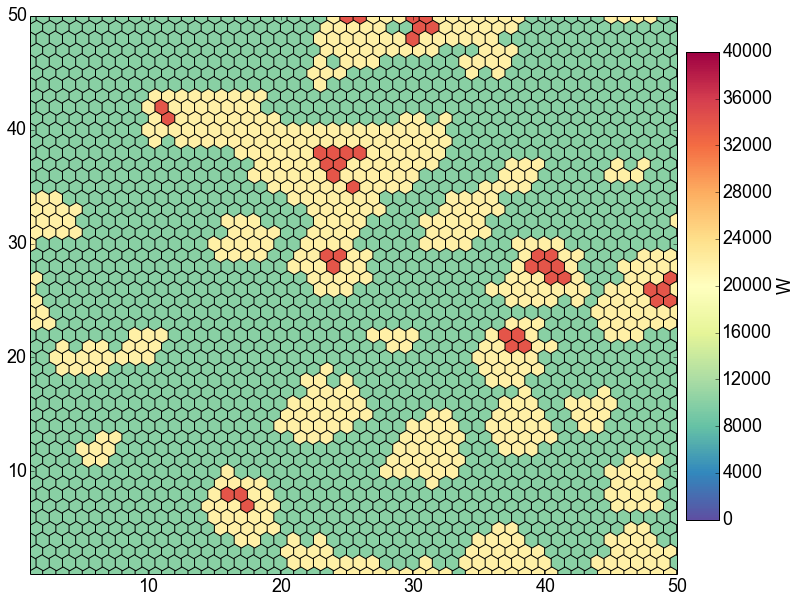

In [12]:
v = 'fng'
r_v = np.arange(0.0,1.01,0.1)
plot_fractionStates(eqs, p, v, r_v, key, tr, pts_i=pts_i, vlim=vlim, nsignal_dict=nsignal_dict, 
                    show_snapshot=False)#, fig_name='./figures/FrStates_J0high_tr_fng.pdf')

p['ldf'] = 1.0
p['ljf'] = 1.0
pts_J070_fng0 = euler_traj(eqs, p, pts=pts_i, vlim=vlim, nsignal_dict=nsignal_dict)
plot_hex(pts_J070_fng0[key], clim=clim, clabel=key, tr=[5000,15000], c=[34000, 22000, 10000], 
         )#fig_name='./figures/Snapshot_J0high_tr_fng0.pdf')
p['ldf'] = 5.0
p['ljf'] = 0.1
pts_J070_fng1 = euler_traj(eqs, p, pts=pts_i, vlim=vlim, nsignal_dict=nsignal_dict)
plot_hex(pts_J070_fng1[key], clim=clim, clabel=key, tr=[5000,15000], c=[34000, 22000, 10000], 
         )#fig_name='./figures/Snapshot_J0high_tr_fng1.pdf')
p['ldf'] = 3.0
p['ljf'] = 0.3

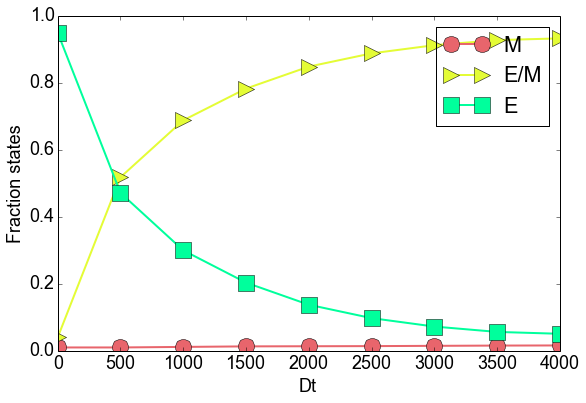

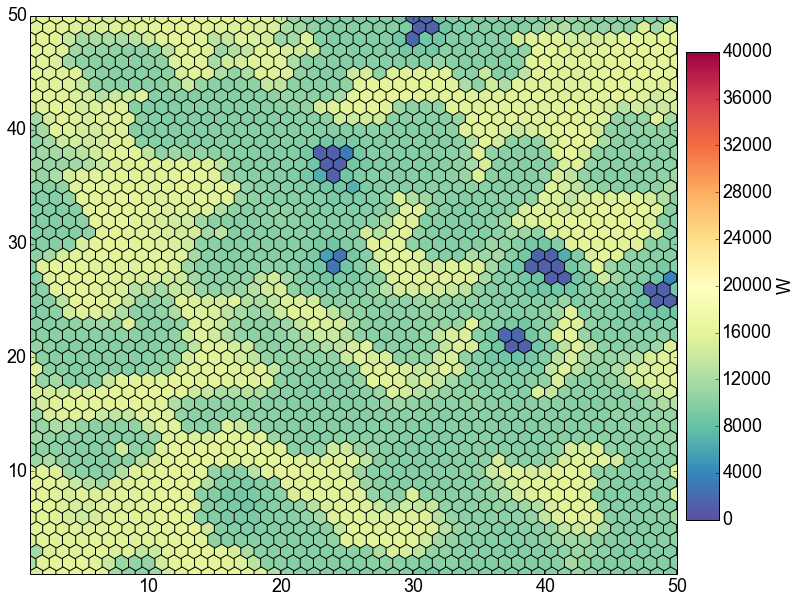

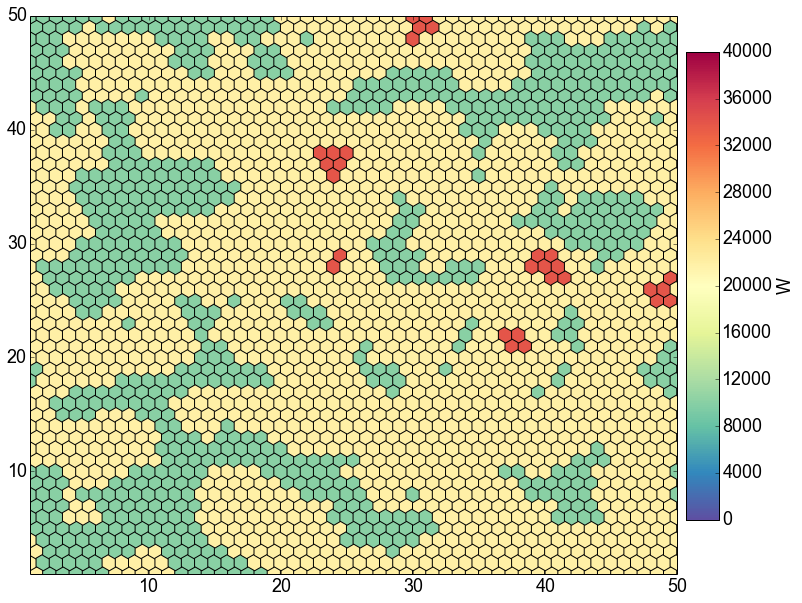

In [13]:
v = 'Dt'
r_v = np.arange(0.0, 4000.1, 500.0)
plot_fractionStates(eqs, p, v, r_v, key, tr, pts_i=pts_J070, vlim=vlim, nsignal_dict=nsignal_dict, 
                    show_snapshot=False)#, fig_name='./figures/FrStates_Dt_J0high.pdf')

p['Dt'] = 1000
pts_J070_Dt1 = euler_traj(eqs, p, pts=pts_J070, vlim=vlim, nsignal_dict=nsignal_dict)
plot_hex(pts_J070_Dt1[key], clim=clim, clabel=key)#, fig_name='./figures/Snapshot_J0high_Dt1.pdf')
plot_hex(pts_J070_Dt1[key], clim=clim, clabel=key, tr=[5000,15000], c=[34000, 22000, 10000],
         )#fig_name='./figures/Snapshot_J0high_Dt1.pdf')

p['Dt'] = 0

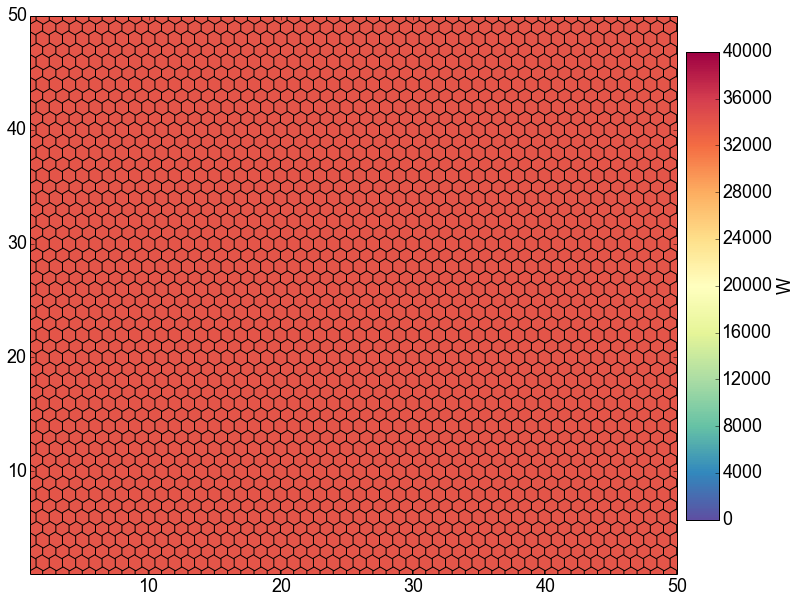

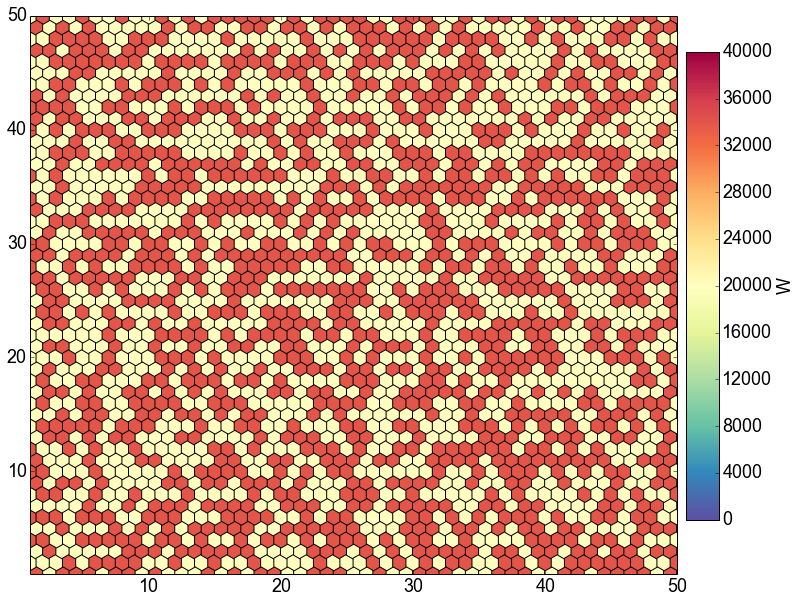

0.5092


In [38]:
p['t']  = p['dt']    # total time in hours

key = 'W'          # key parameter for hexagonal snapshot plot
tr  = {'W': [5000, 15000]}
clim = [0,40000] # Color range for the plot

pts_vlim = euler_traj(eqs, p, pts=None, vlim=vlimM, nsignal_dict=nsignal_dict)
plot_hex(pts_vlim[key], clim=clim, clabel=key, tr=[5000,15000], c=[34000, 20000, 10000])
N = 1750
r = np.random.randint(0, p['n'], (2,N))
for i in range(N):
    for k in eqs.keys():
        pts_vlim[k][r[0,i],r[1,i]] = np.random.uniform(vlimEM[k][0],vlimEM[k][1],1) 
plot_hex(pts_vlim[key], clim=clim, clabel=key, tr=[5000,15000], c=[34000, 20000, 10000])
print np.sum(pts_vlim['W'] > 5000)/np.float(p['n']*p['n'])

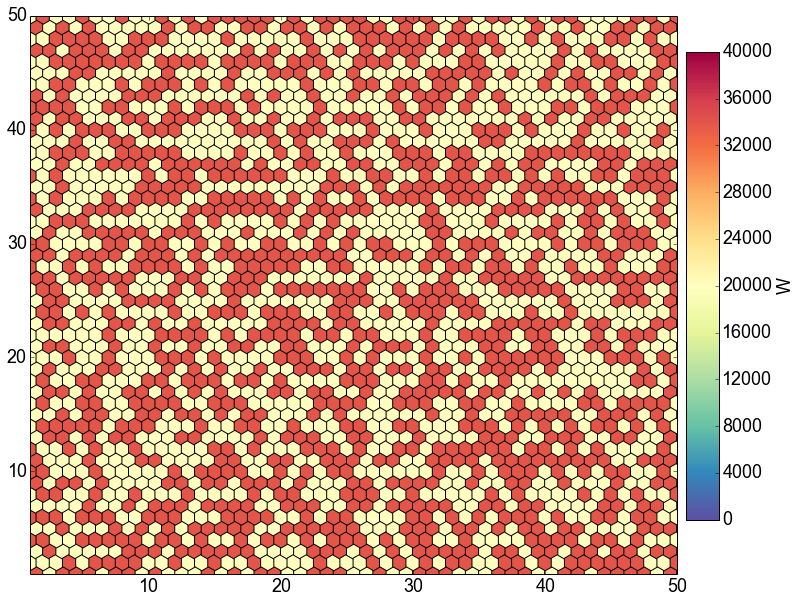

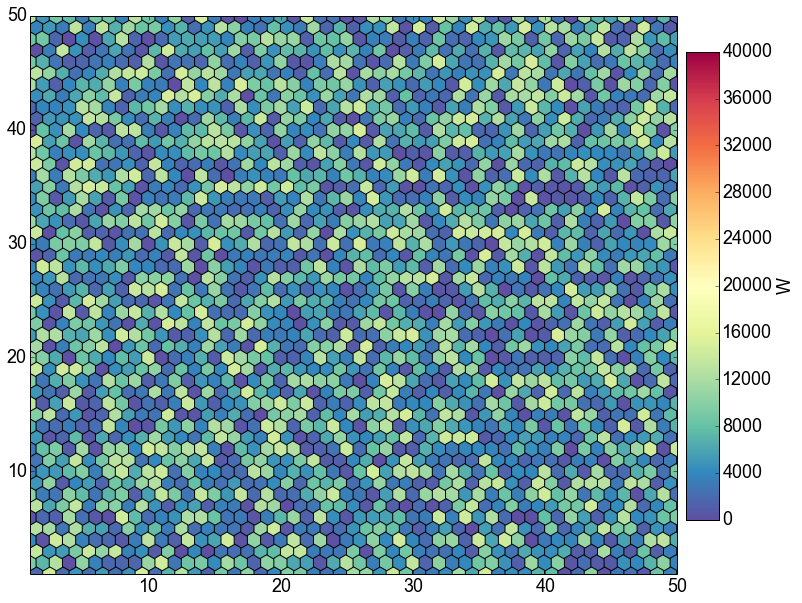

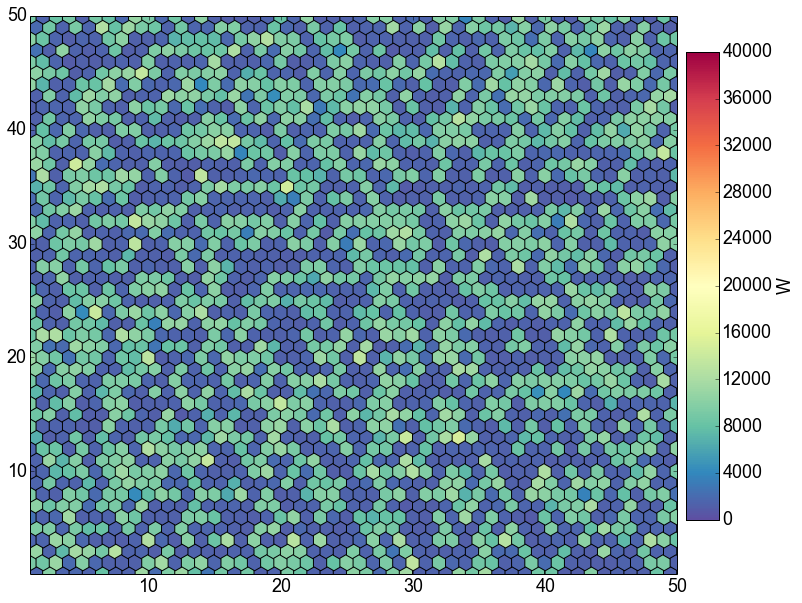

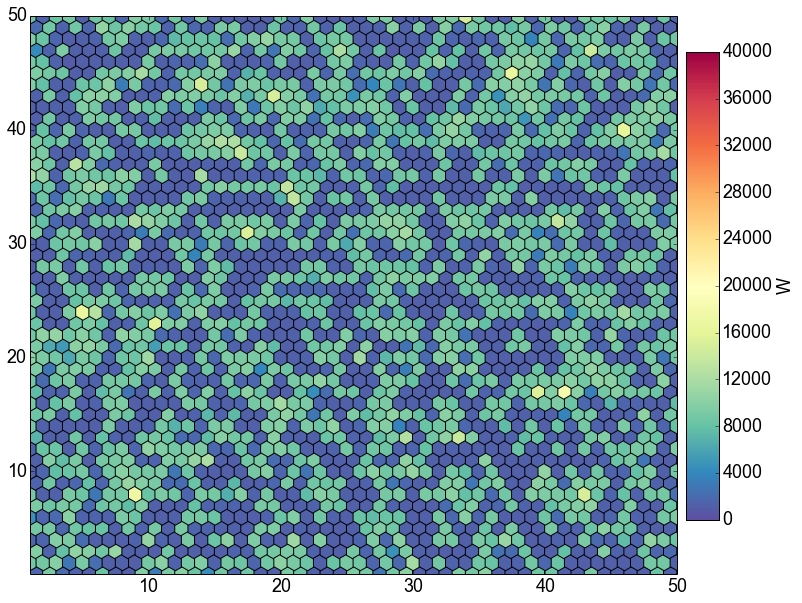

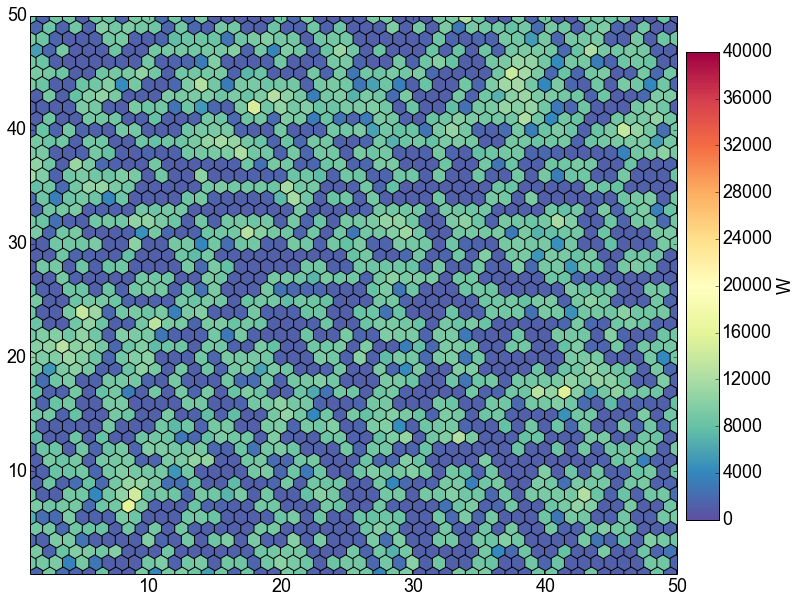

...

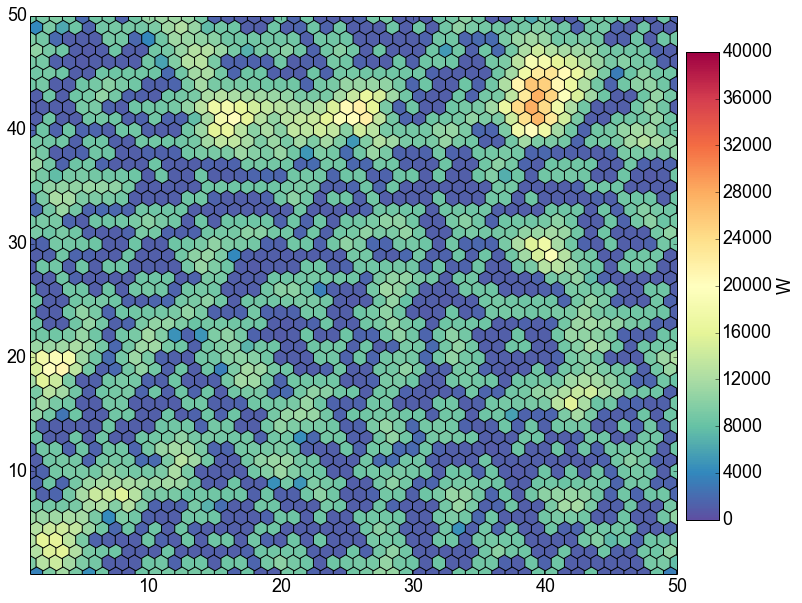

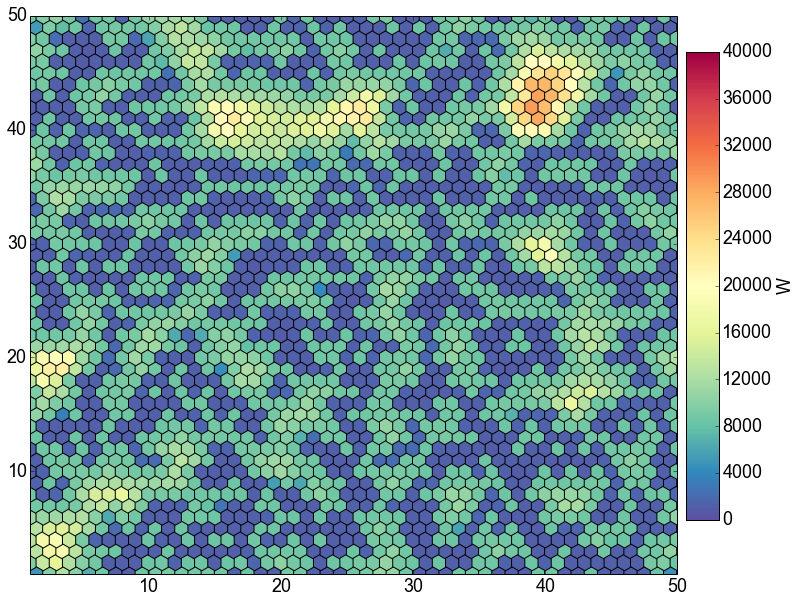

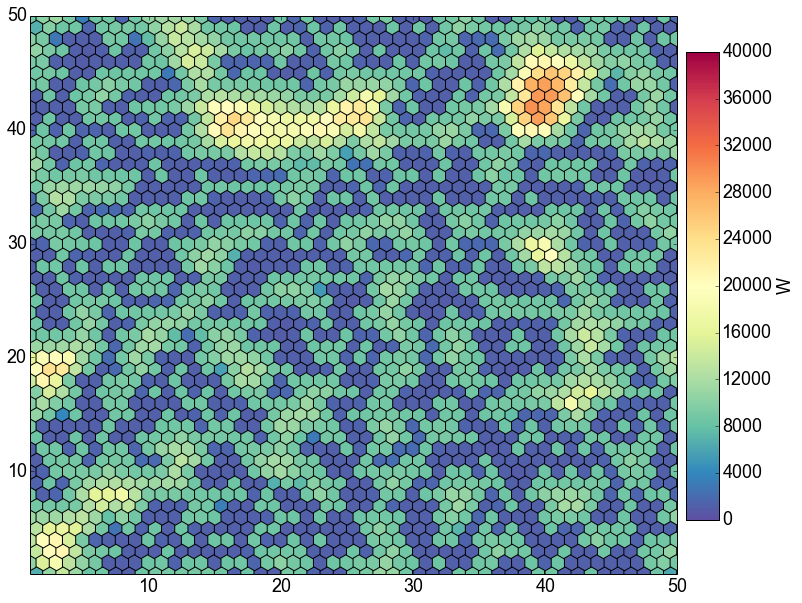

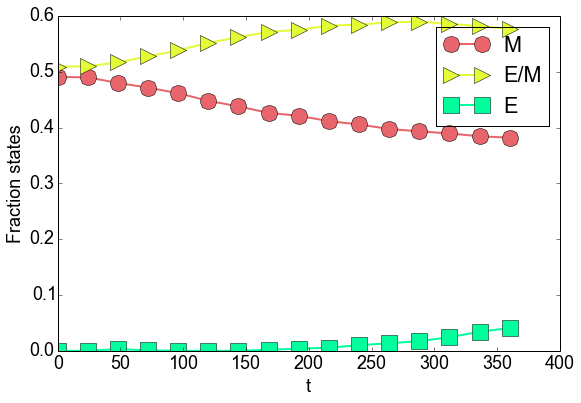

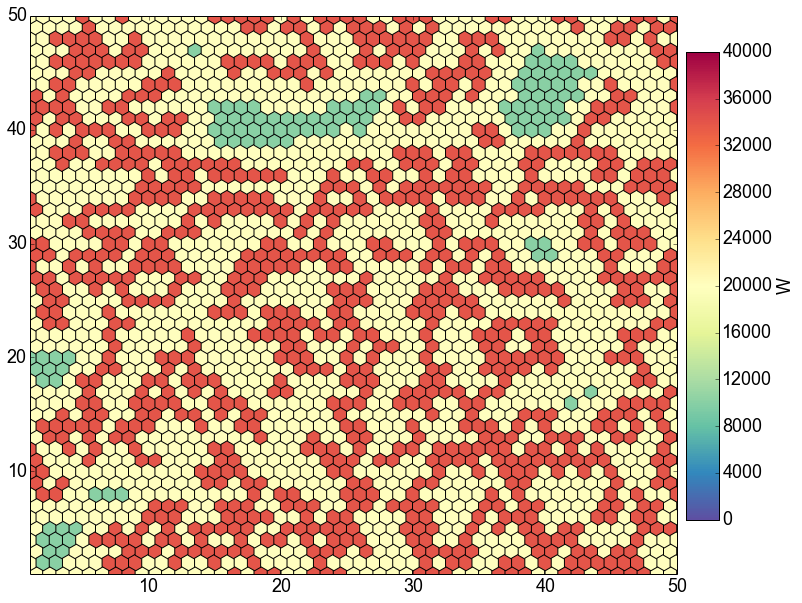

In [39]:
plot_hex(pts_vlim[key], clim=clim, clabel=key, tr=[5000,15000], c=[34000, 20000, 10000]
         ,fig_name='./figures/Snapshot_t0_EM50perc.pdf')
key = ['I','J','D','N']
v = 't'
r_v = np.arange(0.0, 360.1, 24.0)
key = 'W'          # key parameter for hexagonal snapshot plot
plot_fractionStates(eqs, p, v, r_v, key, tr, pts_i=pts_vlim, vlim=vlim, nsignal_dict=nsignal_dict, 
                    show_snapshot=True, fig_name='./figures/FrStates_timeEM50perc.pdf')

p['t'] = 360
pts = euler_traj(eqs, p, pts=pts_vlim, vlim=vlim, nsignal_dict=nsignal_dict)
plot_hex(pts[key], clim=clim, clabel=key, tr=[5000,15000], c=[34000, 20000, 10000],
         fig_name='./figures/Snapshot_t360_EM50perc.pdf')